# Кластеризация

In [2]:
from setup_libs import *

## Постановка задачи

Пусть у нас есть множество объектов $X$, но отсутствует какое-либо множество $y$.

Наша задача: как-то логично разделить объекты $X$ на разные **кластеры**. 

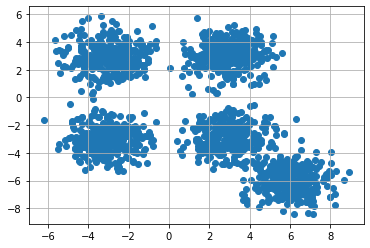

In [11]:
# Generate some data
N = 300

X1 = np.random.randn(N,2) + np.array([3,3])
X2 = np.random.randn(N,2) + np.array([-3,-3])
X3 = np.random.randn(N,2) + np.array([-3,3])
X4 = np.random.randn(N,2) + np.array([3,-3])
X6 = np.random.randn(N,2) + np.array([6,-6])


X = np.vstack([X1, X2, X3, X4, X6])
plt.scatter(X[:,0], X[:,1])
plt.grid()

## K-means

Пусть мы знаем, что кластеров должно получиться $k$, давайте будем проводить следующий алгоритм:


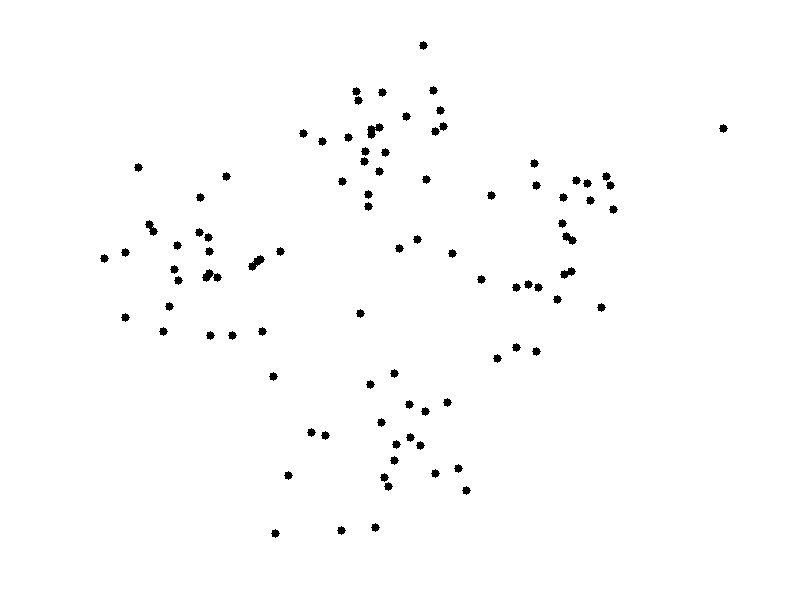

In [3]:
Image('images/kmeans.gif', width=500)

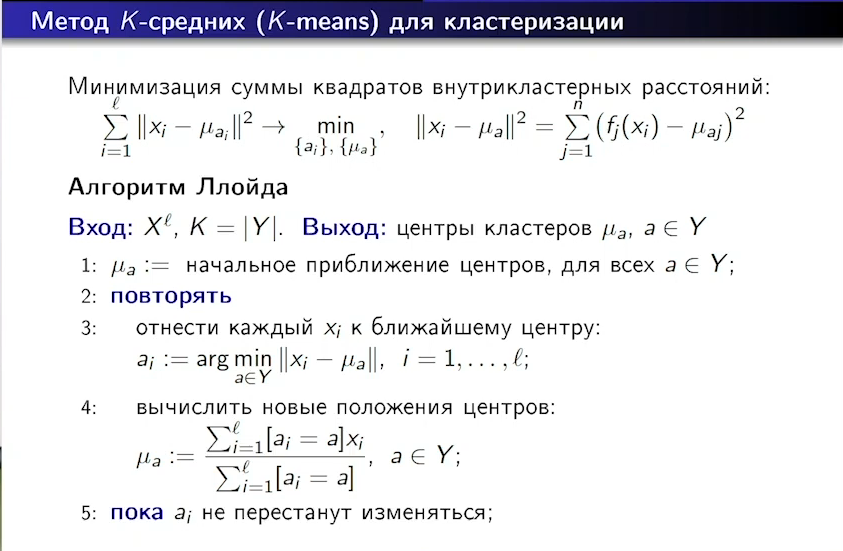

In [19]:
Image('images/kmeans.png', width=500)

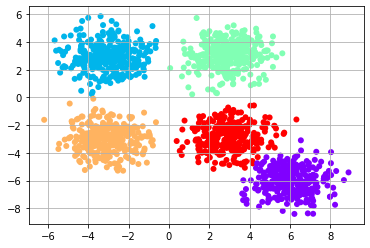

In [12]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5).fit(X)

labels = kmeans.labels_



plt.scatter(X[:,0],X[:,1], c = labels, cmap='rainbow', edgecolors= 'none')
plt.grid()

In [13]:
kmeans.predict([[0, 0], [12, 3]])

array([4, 2], dtype=int32)

In [14]:
kmeans.cluster_centers_


array([[ 6.03344174, -6.04030405],
       [-3.02464132,  2.95957579],
       [ 2.92680113,  3.06159933],
       [-3.07646453, -3.02081963],
       [ 3.0005799 , -2.8753286 ]])

## Проблемы kmeans

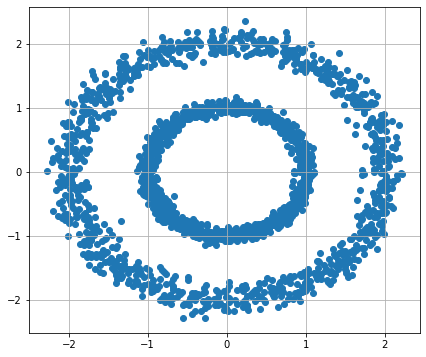

In [15]:
from random import gauss

num_samples = 1000
theta = np.linspace(0, 2*np.pi, num_samples)

r1 = 1
r2 = 2

rng = np.random.RandomState(1)

circle = np.hstack([np.cos(theta).reshape((-1, 1)) + (rng.randn(num_samples)[:,np.newaxis] / 16), 
                    np.sin(theta).reshape((-1, 1)) + (rng.randn(num_samples)[:,np.newaxis] / 16)])
lil = r1 * circle
big = r2 * circle
X = np.vstack([lil, big])

# plots
plt.figure(figsize=(7,6))
plt.scatter(X[:,0],X[:,1])
plt.grid()

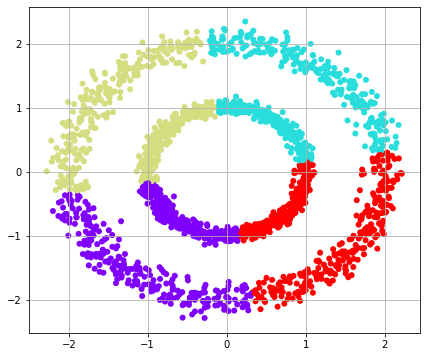

In [16]:
model = KMeans(n_clusters=4).fit(X)

labels = model.labels_

plt.figure(figsize=(7,6))
plt.scatter(X[:,0],X[:,1], c = labels, cmap='rainbow', edgecolors= 'none')
plt.grid()

## DBSCAN

1. Выберем произвольную неразмеченную точку и построили некоторую $\varepsilon$-окрестность.

2. Если в эту эпсилон окрестность попало $m$ и более точек (пусть 3), то мы считаем область плотной и помечаем нашу точку некоторым кластером, а соседей добавляем в очередь. Иначе - помечаем точку шумом.

3. Если очередь не пустая, берем соседа и делаем аналогичную операцию как в шаге 1. 

4. Если очередь пустая, мы фиксируем кластер. И выбираем произвольную из оставшихся точку (не помеченную шумом) и повторяем шаг 1.

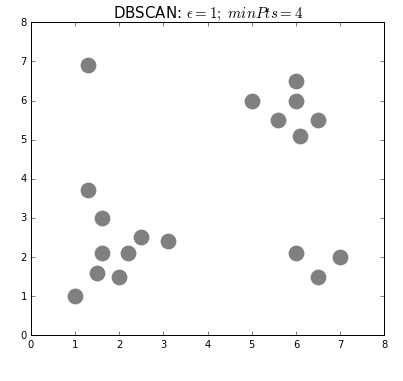

In [17]:
Image('images/dbscan.gif')

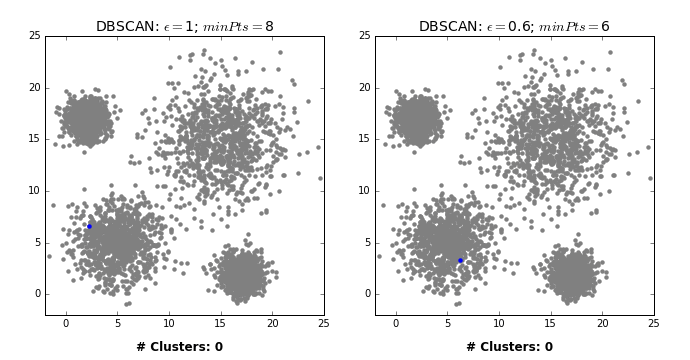

In [18]:
Image('images/DBSCAN_search.gif')

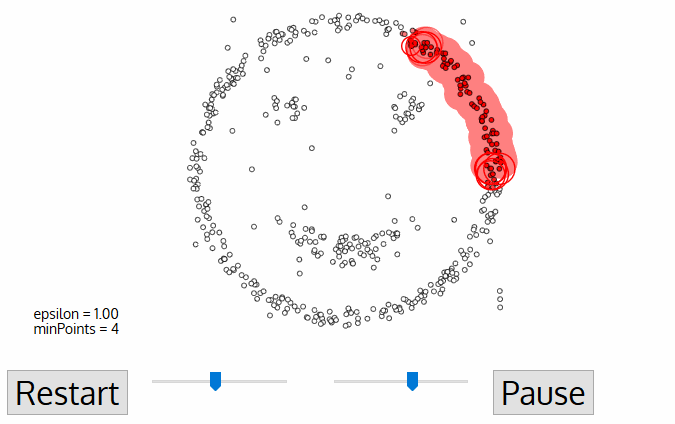

In [43]:
Image('images/smilecluster.gif')

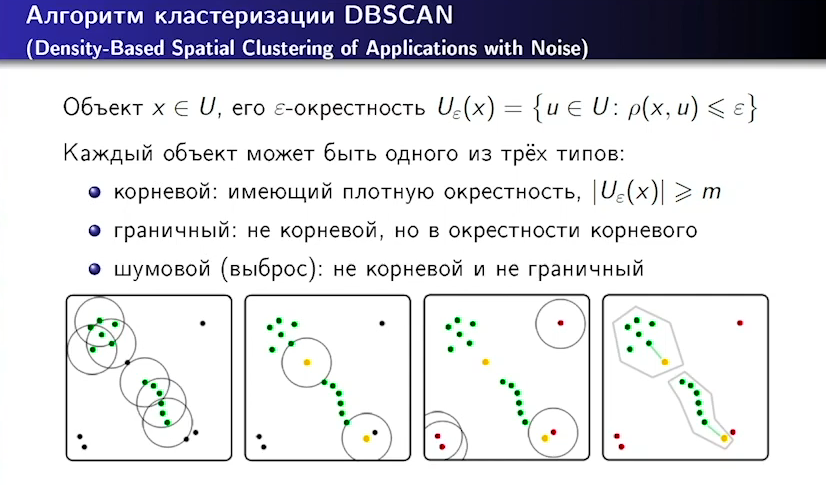

In [44]:
Image('images/vor1.png')

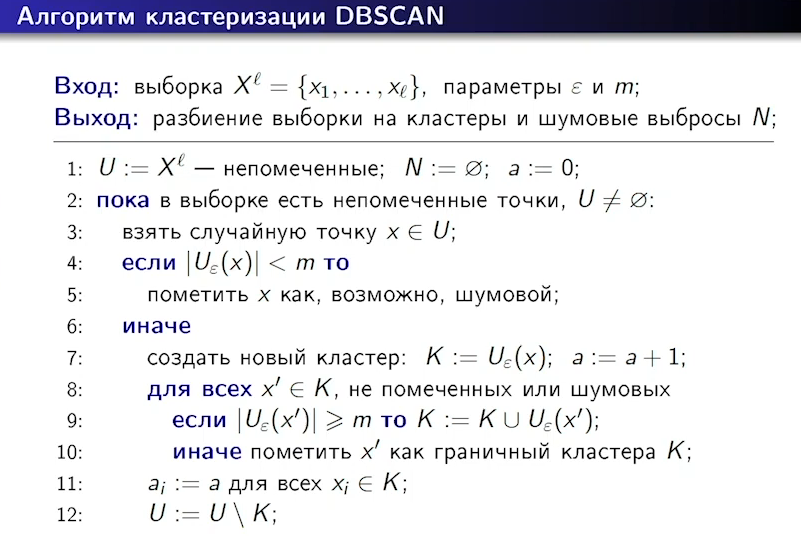

In [45]:
Image('images/vor2.png')

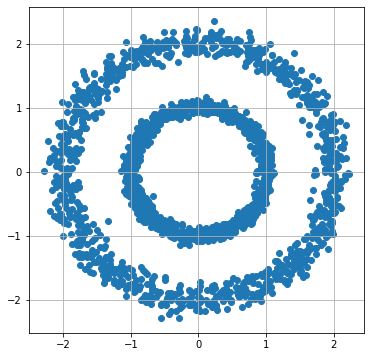

In [20]:
from random import gauss

num_samples = 1000
theta = np.linspace(0, 2*np.pi, num_samples)

r1 = 1
r2 = 2

rng = np.random.RandomState(1)

circle = np.hstack([np.cos(theta).reshape((-1, 1)) + (rng.randn(num_samples)[:,np.newaxis] / 16), 
                    np.sin(theta).reshape((-1, 1)) + (rng.randn(num_samples)[:,np.newaxis] / 16)])
lil = r1 * circle
big = r2 * circle
X = np.vstack([lil, big])

# plots
plt.figure(figsize=(6,6))
plt.scatter(X[:,0],X[:,1])
plt.grid()

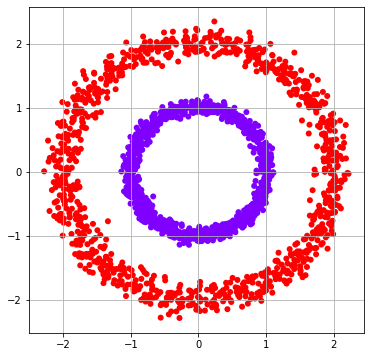

In [22]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.3, min_samples=5).fit(X)

labels = dbscan.labels_

plt.figure(figsize=(6,6))
plt.scatter(X[:,0],X[:,1], c = labels, cmap='rainbow', edgecolors= 'none')
plt.grid()

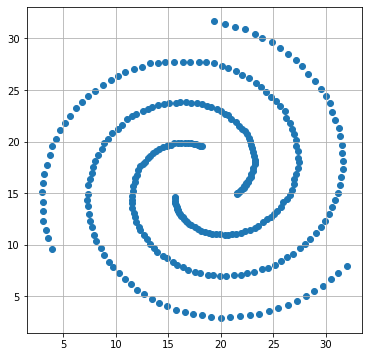

In [23]:
spiral = pd.read_csv('data/spiral.txt', sep='\t', names = ['x', 'y', 'class'])

X = spiral[['x', 'y']].values

plt.figure(figsize=(6,6))
plt.scatter(X[:,0],X[:,1])
plt.grid()

3


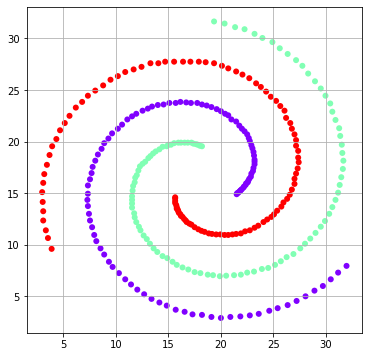

In [24]:
dbscan = DBSCAN(eps=3, min_samples=3).fit(X)

labels = dbscan.labels_


clusters = len(np.unique(labels))

print(clusters)

plt.figure(figsize=(6,6))
plt.scatter(X[:,0],X[:,1], c = labels, cmap='rainbow', edgecolors= 'none')
plt.grid()

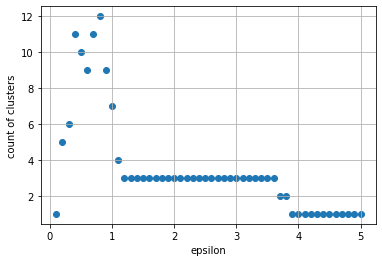

In [25]:
m = 3

eps = np.linspace(0.1, 5, 50)

clusters = []

for ep in eps:
    dbscan = DBSCAN(eps=ep, min_samples=m).fit(X)
    clusters.append(len(np.unique(dbscan.labels_)))
    
plt.scatter(eps, clusters)
plt.xlabel('epsilon')
plt.ylabel('count of clusters')
plt.grid()

## Ссылки

* [Хабр DBSCAN](https://habr.com/ru/post/322034/)
* [Хабр Affinity Propagation](https://habr.com/en/post/321216/)
* [Кластеризация от Воронцова](https://www.youtube.com/watch?v=UTm2-G3VeQQ&list=PLJOzdkh8T5krxc4HsHbB8g8f0hu7973fK&index=12)